# Test tabular method

In this notebook I test all the algorithms and implementation realized for tabular methods starting from Q-Leanring

In [1]:
import gymnasium as gym 
import matplotlib.pyplot as plt 
import seaborn as sns 
import pandas as pd 
import numpy as np 
import torch
import tensorflow as tf 
import matplotlib.pyplot as plt
import random
import os
import timeit
import datetime

from pathlib import Path

from environment import TabularFarmEnv
from Tabularalgorithms import TabularQLearningAgent, TabularSARSALambdaAgent

2024-08-07 14:25:38.221380: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-08-07 14:25:38.314378: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-08-07 14:25:39.980168: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


#### Tabular method with Q-Learning algorithm

In [2]:
#define path to saving directory
TrainedQTabular_model = Path('/home/elisa/Desktop/Uni/SecondY/RL/SecondPart/SummerClaude/TrainedQTabular/Model')
TrainedQTabular_data = Path('/home/elisa/Desktop/Uni/SecondY/RL/SecondPart/SummerClaude/TrainedQTabular/Data')
TrainedQTabular_plots = Path('/home/elisa/Desktop/Uni/SecondY/RL/SecondPart/SummerClaude/TrainedQTabular/Plots') 

In [3]:
#initialize agent and environment
env = gym.make('TabularFarm-v0') #try to acces the environment and change
agent = TabularQLearningAgent(env)

In [8]:
n_episodes = 1000000
rewards = []
episode_lengths = []

for episode in range(n_episodes):
    state = env.reset()
    done = False
    total_reward = 0
    steps = 0

    while not done:
        action = agent.act(state)
        next_state, reward, done, _ = env.step(action)
        agent.train(state, action, reward, next_state, done)
        state = next_state
        total_reward += reward
        steps += 1

    rewards.append(total_reward)
    episode_lengths.append(steps)

    if episode % 100 == 0:
        print(f"Episode {episode}, Total Reward: {total_reward}, Epsilon: {agent.epsilon:.2f}")

#saving the trained model for later
now = datetime.datetime.now()
formatted_time = now.strftime("%Y%m%d_%H%M%S")
filename = f"q_table_{n_episodes}_{formatted_time}.npy"

agent.save(TrainedQTabular_model, f"q_table_final_{formatted_time}.npy")

#saving the training results for later analysis
filename = f"rewards_{formatted_time}.npy"
if not os.path.exists(TrainedQTabular_data):
    os.makedirs(TrainedQTabular_data)
np.save(os.path.join(TrainedQTabular_data,filename),rewards)


filename = f"episode_length_{formatted_time}.npy"
if not os.path.exists(TrainedQTabular_data):
    os.makedirs(TrainedQTabular_data)
np.save(os.path.join(TrainedQTabular_data,filename), episode_lengths)

Episode 0, Total Reward: 6200, Epsilon: 0.01
Episode 100, Total Reward: 8700, Epsilon: 0.01
Episode 200, Total Reward: 8600, Epsilon: 0.01
Episode 300, Total Reward: 1650, Epsilon: 0.01
Episode 400, Total Reward: 4050, Epsilon: 0.01
Episode 500, Total Reward: 6900, Epsilon: 0.01
Episode 600, Total Reward: 7400, Epsilon: 0.01
Episode 700, Total Reward: -46220, Epsilon: 0.01
Episode 800, Total Reward: 9050, Epsilon: 0.01
Episode 900, Total Reward: -40250, Epsilon: 0.01
Episode 1000, Total Reward: 7650, Epsilon: 0.01
Episode 1100, Total Reward: 9050, Epsilon: 0.01
Episode 1200, Total Reward: 3150, Epsilon: 0.01
Episode 1300, Total Reward: 8750, Epsilon: 0.01
Episode 1400, Total Reward: 8150, Epsilon: 0.01
Episode 1500, Total Reward: 6650, Epsilon: 0.01
Episode 1600, Total Reward: 5300, Epsilon: 0.01
Episode 1700, Total Reward: 6950, Epsilon: 0.01
Episode 1800, Total Reward: 8350, Epsilon: 0.01
Episode 1900, Total Reward: 8450, Epsilon: 0.01
Episode 2000, Total Reward: 7300, Epsilon: 0.01


KeyboardInterrupt: 

NameError: name 'formatted_time' is not defined

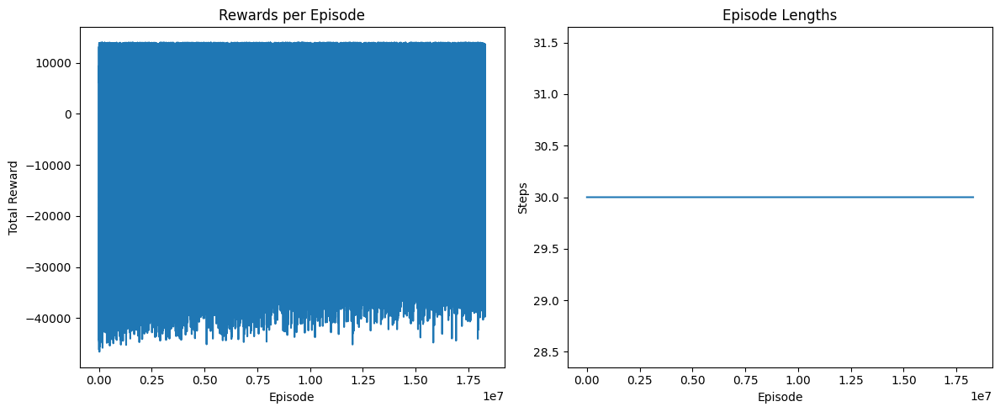

In [9]:
#plot results

plt.figure(figsize=(12, 5))
plt.subplot(121)
plt.plot(rewards)
plt.title('Rewards per Episode')
plt.xlabel('Episode')
plt.ylabel('Total Reward')

plt.subplot(122)
plt.plot(episode_lengths)
plt.title('Episode Lengths')
plt.xlabel('Episode')
plt.ylabel('Steps')

plt.tight_layout()
filename = f"training_progress_{formatted_time}.png"
if not os.path.exists(TrainedQTabular_plots):
    os.makedirs(TrainedQTabular_plots)
file_path = TrainedQTabular_plots / filename
plt.savefig(file_path)
plt.show()

In [ ]:
#running the pre-trained model
env = gym.make('TabularFarm-v0')
agent = TabularQLearningAgent(env)

# Load the previously saved model
agent.load("q_table_final.npy")

state = env.reset()
done = False
total_reward = 0

while not done:
    action = agent.act(state)
    next_state, reward, done, _ = env.step(action)
    state = next_state
    total_reward += reward

print(f"Test episode completed. Total Reward: {total_reward}")

#### Tabular method with SARSA(λ)

In [9]:
env = gym.make('TabularFarm-v0')
agent = TabularSARSALambdaAgent(env)

n_episodes = 500000
rewards = []
episode_lengths = []

for episode in range(n_episodes):
    state = env.reset()
    action = agent.act(state)
    done = False
    total_reward = 0
    steps = 0

    while not done:
        next_state, reward, done, _ = env.step(action)
        next_action = agent.act(next_state)
        agent.train(state, action, reward, next_state, next_action, done)
        
        state = next_state
        action = next_action
        total_reward += reward
        steps += 1

    rewards.append(total_reward)
    episode_lengths.append(steps)

    if episode % 100 == 0:
        print(f"Episode {episode}, Total Reward: {total_reward}, Steps: {steps}, Epsilon: {agent.epsilon:.2f}")

/home/elisa/Desktop/Uni/SecondY/RL/SecondPart/Final/final/lib/python3.10/site-packages/gymnasium/utils/passive_env_checker.py:189: UserWarning: WARN: The result returned by `env.reset()` was not a tuple of the form `(obs, info)`, where `obs` is a observation and `info` is a dictionary containing additional information. Actual type: `<class 'list'>`
  logger.warn(
/home/elisa/Desktop/Uni/SecondY/RL/SecondPart/Final/final/lib/python3.10/site-packages/gymnasium/utils/passive_env_checker.py:213: DeprecationWarning: WARN: Core environment is written in old step API which returns one bool instead of two. It is recommended to rewrite the environment with new step API. 
  logger.deprecation(
/home/elisa/Desktop/Uni/SecondY/RL/SecondPart/Final/final/lib/python3.10/site-packages/gymnasium/utils/passive_env_checker.py:140: UserWarning: WARN: The obs returned by the `step()` method was expecting a numpy array, actual type: <class 'list'>
  logger.warn(f"{pre} was expecting a numpy array, actual ty

Episode 0, Total Reward: -43130, Steps: 30, Epsilon: 0.86
Episode 100, Total Reward: -37890, Steps: 30, Epsilon: 0.01
Episode 200, Total Reward: -35380, Steps: 30, Epsilon: 0.01
Episode 300, Total Reward: -18610, Steps: 30, Epsilon: 0.01
Episode 400, Total Reward: -10470, Steps: 30, Epsilon: 0.01
Episode 500, Total Reward: -8600, Steps: 30, Epsilon: 0.01
Episode 600, Total Reward: 7450, Steps: 30, Epsilon: 0.01
Episode 700, Total Reward: 5450, Steps: 30, Epsilon: 0.01
Episode 800, Total Reward: 6200, Steps: 30, Epsilon: 0.01
Episode 900, Total Reward: 10600, Steps: 30, Epsilon: 0.01
Episode 1000, Total Reward: 6300, Steps: 30, Epsilon: 0.01
Episode 1100, Total Reward: 9400, Steps: 30, Epsilon: 0.01
Episode 1200, Total Reward: 8600, Steps: 30, Epsilon: 0.01
Episode 1300, Total Reward: 5400, Steps: 30, Epsilon: 0.01
Episode 1400, Total Reward: 8500, Steps: 30, Epsilon: 0.01
Episode 1500, Total Reward: 9450, Steps: 30, Epsilon: 0.01
Episode 1600, Total Reward: 10250, Steps: 30, Epsilon: 0

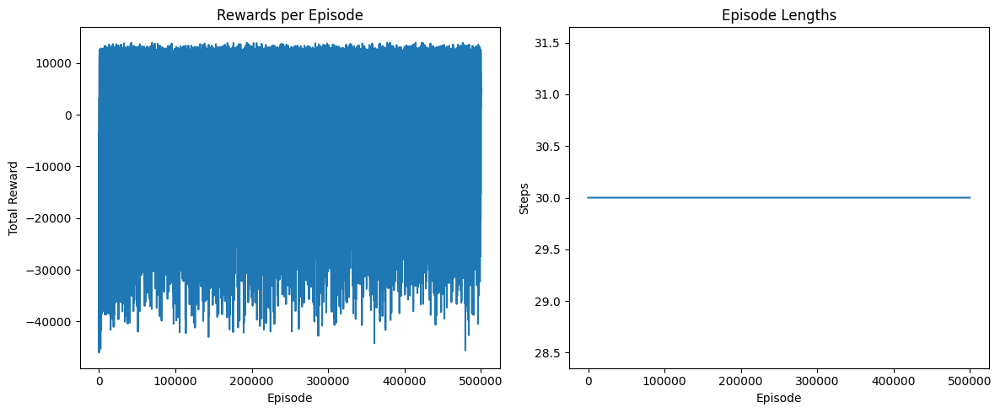

In [10]:
#plot results

plt.figure(figsize=(12, 5))
plt.subplot(121)
plt.plot(rewards)
plt.title('Rewards per Episode')
plt.xlabel('Episode')
plt.ylabel('Total Reward')

plt.subplot(122)
plt.plot(episode_lengths)
plt.title('Episode Lengths')
plt.xlabel('Episode')
plt.ylabel('Steps')

plt.tight_layout()
plt.show()